In [2]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/cv-images/H-min.jpg
/kaggle/input/cv-images/galaxy.jpg
/kaggle/input/cv-images/tf_weights_1.index
/kaggle/input/cv-images/corners-min.jpg
/kaggle/input/cv-images/Cat.jpg
/kaggle/input/cv-images/gomez_swift-min.jpg
/kaggle/input/cv-images/morph-min.jpg
/kaggle/input/cv-images/finance-min.jpg
/kaggle/input/cv-images/Dog.jpg
/kaggle/input/cv-images/contours-min.jpg
/kaggle/input/cv-images/retail-min.png
/kaggle/input/cv-images/color_space_cat.jpg
/kaggle/input/cv-images/gomez-min.jpg
/kaggle/input/cv-images/tf_weights_1.data-00000-of-00001
/kaggle/input/cv-images/healthcare-min.jpg
/kaggle/input/cv-images/security-min.png
/kaggle/input/cv-images/GR-min.jpg
/kaggle/input/cv-images/book-min.jpg
/kaggle/input/cv-images/industry-min.png
/kaggle/input/cv-images/lymphocytes-min.jpg
/kaggle/input/cv-images/automotive-min.jpg
/kaggle/input/cv-images/checkpoint
/kaggle/input/cv-images/hough-min.png
/kaggle/input/cv-images/mask.png
/kaggle/input/cv-images/elon-min.jpg
/kaggle/input/cv

<h1 style = 'background-color:purple;color:white;font-family:COMIC SANS MS'> <center> 👁 COMPUTER VISION 👁 </center> </h1>

<p style = 'background-color:black;color:white;font-family:Georgia;font-size:18px'> Computer Vision is a field of Computer Science that helps computers understand and interpret the visual world around us. It makes use of the images and videos captured on cameras to develop models and techniques to process and analyze the underlying features. Computer Vision is a strong pillar of Artificial Intelligence that has wide-ranging applications in diverse domains.</p>

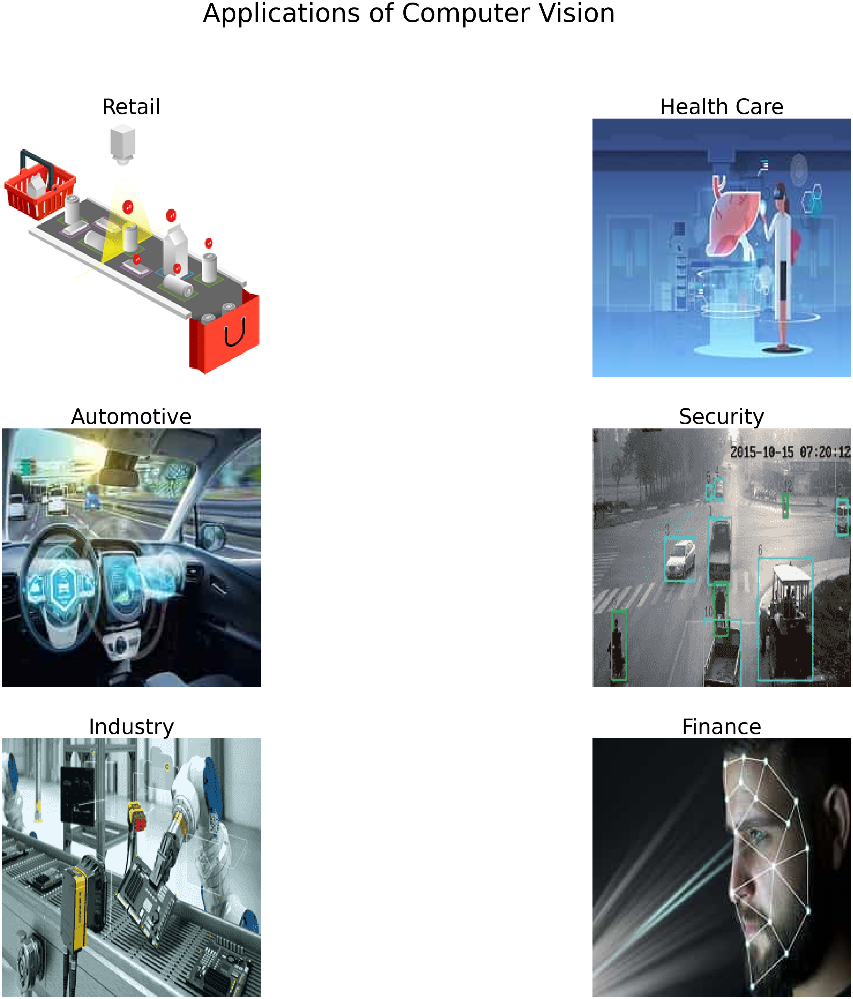

In [3]:
retail = cv2.imread('../input/cv-images/retail-min.png', cv2.IMREAD_COLOR)
healthcare = cv2.imread('../input/cv-images/healthcare-min.jpg', cv2.IMREAD_COLOR)
automotive = cv2.imread('../input/cv-images/automotive-min.jpg', cv2.IMREAD_COLOR)
security = cv2.imread('../input/cv-images/security-min.png', cv2.IMREAD_COLOR)
industry = cv2.imread('../input/cv-images/industry-min.png', cv2.IMREAD_COLOR)
finance = cv2.imread('../input/cv-images/finance-min.jpg', cv2.IMREAD_COLOR)

plt.figure(figsize=(60, 50))
plt.subplot(3, 2, 1).set_title('Retail', fontsize = 65); plt.axis('off')   
plt.imshow(cv2.cvtColor(retail, cv2.COLOR_BGR2RGB))
plt.subplot(3, 2, 2).set_title('Health Care', fontsize = 65); plt.axis('off')   
plt.imshow(cv2.cvtColor(healthcare, cv2.COLOR_BGR2RGB))
plt.subplot(3, 2, 3).set_title('Automotive', fontsize = 65); plt.axis('off')   
plt.imshow(cv2.cvtColor(automotive, cv2.COLOR_BGR2RGB))
plt.subplot(3, 2, 4).set_title('Security', fontsize = 65); plt.axis('off')   
plt.imshow(cv2.cvtColor(security, cv2.COLOR_BGR2RGB))
plt.subplot(3, 2, 5).set_title('Industry', fontsize = 65); plt.axis('off')   
plt.imshow(cv2.cvtColor(industry, cv2.COLOR_BGR2RGB))
plt.subplot(3, 2, 6).set_title('Finance', fontsize = 65); plt.axis('off')   
plt.imshow(cv2.cvtColor(finance, cv2.COLOR_BGR2RGB))
plt.suptitle('Applications of Computer Vision', fontsize = 80)
plt.show()    

<h1 style = 'background-color:purple;color:white;font-family:COMIC SANS MS'> <center> 📝 DESCRIPTION 📝 </center> </h1>

<p style = 'background-color:black;color:white;font-family:Georgia;font-size:18px'> This notebook intends to explore Computer Vision using OpenCV. OpenCV is a popular, free, and open-source library for Computer Vision developed by Intel. This notebook will discuss fundamental Computer Vision concepts and their implementations by playing around with the library and harnessing its functionalities. Please upvote and share the notebook if you found it helpful in any way. Thank you in advance! <br><br> Note: <br> 📌 All images are sourced from the internet. <br> 📌 Reference: <a href = "https://opencv-python-tutroals.readthedocs.io/en/latest/index.html"> OpenCV Documentation </a> </p>

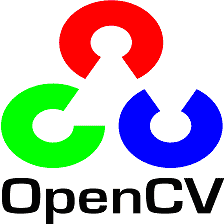

<h1 style = 'background-color:purple;color:white;font-family:COMIC SANS MS'> <center> 🔗 CONTENT 🔗 </center> </h1>

1. [IMPORT LIBRARIES](#sec1) <br>
2. [RGB IMAGE AND RESIZING](#sec2) <br>
3. [GRAYSCALE IMAGE](#sec3) <br>
4. [IMAGE DENOISING](#sec4) <br>
5. [IMAGE THRESHOLDING](#sec5) <br>
6. [IMAGE GRADIENTS](#sec6) <br>
7. [EDGE DETECTION](#sec7) <br>
8. [FOURIER TRANSFORM ON IMAGE](#sec8) <br>
9. [LINE TRANSFORM](#sec9) <br>
10. [CORNER DETECTION](#sec10) <br>
11. [MORPHOLOGICAL TRANSFORMATION OF IMAGE](#sec11) <br>
12. [GEOMETRIC TRANSFORMATION OF IMAGE](#sec12) <br>
13. [CONTOURS](#sec13) <br>
14. [IMAGE PYRAMIDS](#sec14) <br>
15. [COLORSPACE CONVERSION AND OBJECT TRACKING](#sec15) <br>
16. [INTERACTIVE FOREGROUND EXTRACTION](#sec16) <br>
17. [IMAGE SEGMENTATION](#sec17) <br>
18. [IMAGE INPAINTING](#sec18) <br>
19. [TEMPLATE MATCHING](#sec19) <br>
20. [FACE AND EYE DETECTION](#sec20) <br>

<h1 id = 'sec1' style = 'background-color:purple;color:white;font-family:COMIC SANS MS'> <center> 📃 IMPORT LIBRARIES 📃 </center> </h1>

## **IMPORT LIBRARIES**

In [4]:
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt
%matplotlib inline

<h1 id = 'sec2' style = 'background-color:purple;color:white;font-family:COMIC SANS MS'> <center> 🌈 RGB IMAGE AND RESIZING 🌈 </center> </h1>

## **RGB IMAGE AND RESIZING**

<p style = 'background-color:black;color:white;font-family:Georgia;font-size:18px'> An RGB image where RGB indicates Red, Green, and Blue respectively can be considered as three images stacked on top of each other. It also has a nickname called 'True Color Image' as it represents a real-life image as close as possible and is based on human perception of colors. The RGB color model is used to display images on cameras, televisions, and computers. <br><br> Resizing all images to a particular height and width will ensure uniformity and thus makes processing them easier since images are naturally available in different sizes. If the size is reduced, though the processing is faster, data might be lost in the image. If the size is increased, the image may appear fuzzy or pixelated. Additional information is usually filled using interpolation. </p>

In [5]:
height = 224
width = 224
font_size = 20
paths = ['../input/cv-images/Dog.jpg', '../input/cv-images/Cat.jpg']

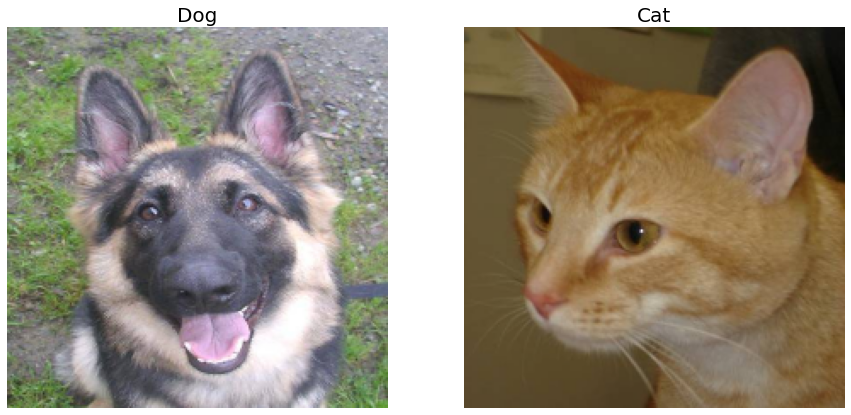

In [6]:
plt.figure(figsize=(15, 8))
for i, path in enumerate(paths):
    
    name = os.path.split(path)[-1]
    img = cv2.imread(path, cv2.IMREAD_COLOR)
    resized_img = cv2.resize(img, (height, width))
    
    plt.subplot(1, 2, i+1).set_title(name[ : -4], fontsize = font_size); plt.axis('off')
    plt.imshow(cv2.cvtColor(resized_img, cv2.COLOR_BGR2RGB))
plt.show()

<h1 id = 'sec3' style = 'background-color:purple;color:white;font-family:COMIC SANS MS'> <center> ⚫ GRAYSCALE IMAGE ⚪ </center> </h1>

## **GRAYSCALE IMAGE**

<p style = 'background-color:black;color:white;font-family:Georgia;font-size:18px'> Grayscale images are images that are shades of gray. It represents the degree of luminosity and carries the intensity information of pixels in the image. Black is the weakest intensity and white is the strongest intensity. Grayscale images are efficient as they are simpler and faster than color images during image processing. Some of these methods will be covered further in the notebook. </p>

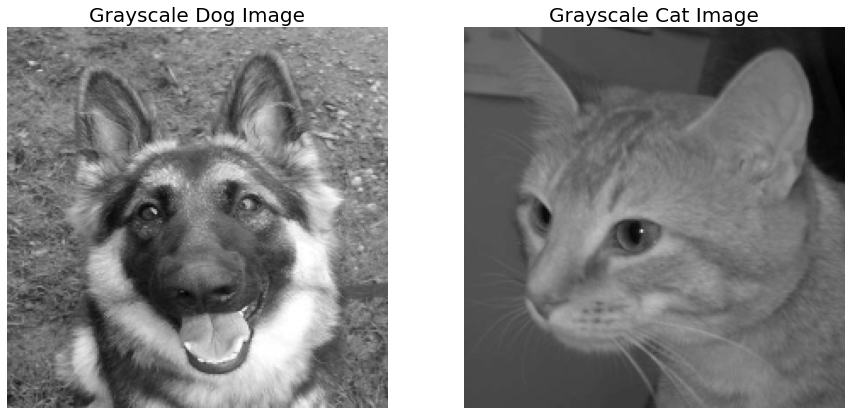

In [7]:
plt.figure(figsize=(15, 8))
for i, path in enumerate(paths):
    
    name = os.path.split(path)[-1]
    img = cv2.imread(path, 0)
    resized_img = cv2.resize(img, (height, width))
    
    plt.subplot(1, 2, i + 1).set_title(f'Grayscale {name[ : -4]} Image', fontsize = font_size); plt.axis('off')
    plt.imshow(resized_img, cmap='gray')
plt.show()

<h1 id = 'sec4' style = 'background-color:purple;color:white;font-family:COMIC SANS MS'> <center> 🔇 IMAGE DENOISING 🔇 </center> </h1>

## **IMAGE DENOISING**

<p style = 'background-color:black;color:white;font-family:Georgia;font-size:18px'> Image denoising removes noise from the image. It is also known as 'Image Smoothing'. The image is convolved with a low pass filter kernel which gets rid of high-frequency content like edges of an image. There are many image blurring techniques as follows.
<br><br> 📌 Averaging - Image blurring where central element is replaced by the average of all pixels in kernel area <br> 📌 Gaussian Filtering - Image blurring using Gaussian function <br> 📌 Median Filtering - Image blurring where central element is replaced by the median of all pixels in kernel area <br> 📌 Bilateral Filtering - Image blurring where the intensity of each pixel is replaced by the weighted average of intensity values from nearby pixels <br><br> Median Filtering is employed in the implementation below. Since all the central elements are replaced by pixel values that were already present in the image, it effectively reduces salt and pepper noise. 
</p>

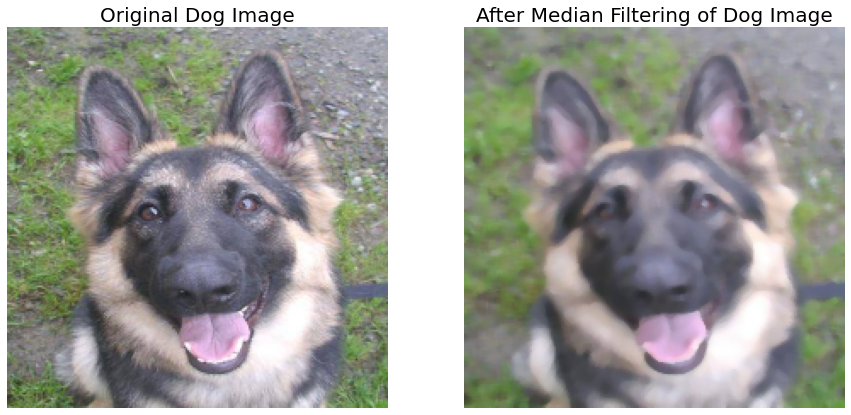

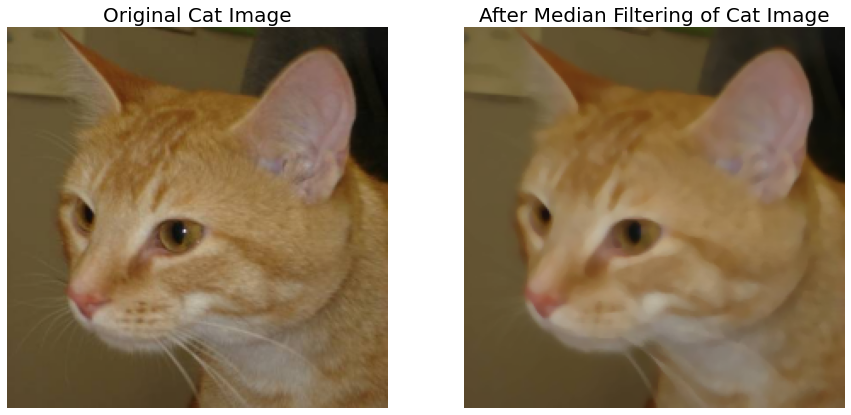

In [8]:
for i, path in enumerate(paths):
    
    name = os.path.split(path)[-1]
    img = cv2.imread(path, cv2.IMREAD_COLOR)
    resized_img = cv2.resize(img, (height, width))
    
    denoised_img = cv2.medianBlur(resized_img, 5)
    
    plt.figure(figsize=(15, 8))
    plt.subplot(1, 2, 1).set_title(f'Original {name[ : -4]} Image', fontsize = font_size); plt.axis('off')
    plt.imshow(cv2.cvtColor(resized_img, cv2.COLOR_BGR2RGB))
    plt.subplot(1, 2, 2).set_title(f'After Median Filtering of {name[ : -4]} Image', fontsize = font_size); plt.axis('off')
    plt.imshow(cv2.cvtColor(denoised_img, cv2.COLOR_BGR2RGB))
    plt.show()

<h1 id = 'sec5' style = 'background-color:purple;color:white;font-family:COMIC SANS MS'> <center> ⏲ IMAGE THRESHOLDING ⏲ </center> </h1>

## **IMAGE THRESHOLDING**

<p style = 'background-color:black;color:white;font-family:Georgia;font-size:18px'> Image Thresholding is self-explanatory. If the pixel value in an image is above a certain threshold, a particular value is assigned and if it is below the threshold, another particular value is assigned. There are many thresholding styles as follows. </p>

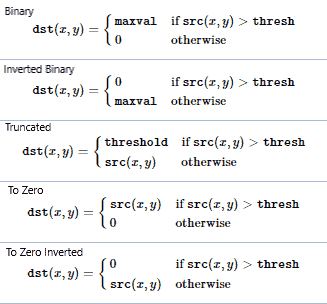

<p style = 'background-color:black;color:white;font-family:Georgia;font-size:18px'> Adaptive Thresholding does not have global threshold values. Instead, a threshold is set for a small region of the image. Hence, there are different thresholds for the entire image and they produce greater outcomes for dissimilar illumination. There are different Adaptive Thresholding methods as follows <br><br> 📌 cv2.ADAPTIVE_THRESH_MEAN_C - Threshold is the mean of the neighborhood area values <br> 📌 cv2.ADAPTIVE_THRESH_GAUSSIAN_C - Threshold is the weighted sum of the neighborhood area values <br><br> Adaptive Thresholding is implemented below.</p>

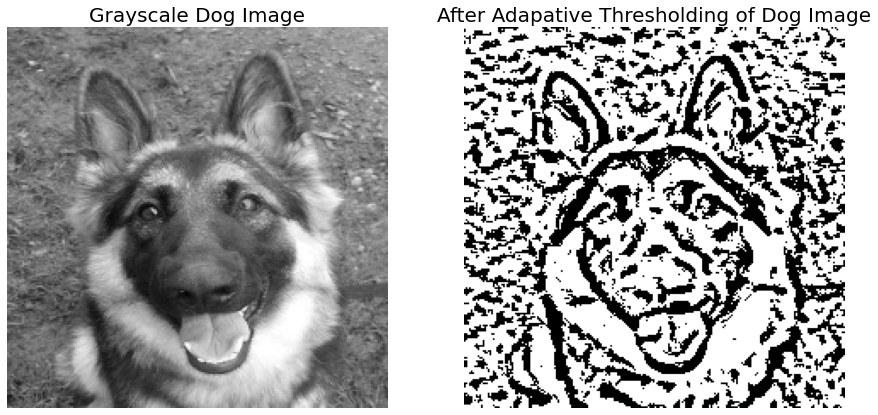

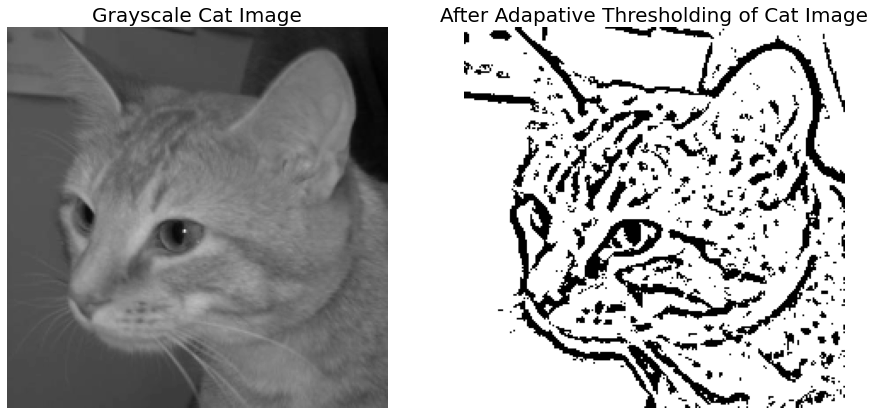

In [9]:
for i, path in enumerate(paths):
    
    name = os.path.split(path)[-1]
    img = cv2.imread(path, 0)
    resized_img = cv2.resize(img, (height, width))
    denoised_img = cv2.medianBlur(resized_img, 5)
    
    th = cv2.adaptiveThreshold(denoised_img, maxValue = 255, adaptiveMethod = cv2.ADAPTIVE_THRESH_GAUSSIAN_C, thresholdType = cv2.THRESH_BINARY, blockSize = 11, C = 2)
    
    plt.figure(figsize=(15, 8))
    plt.subplot(1, 2, 1).set_title(f'Grayscale {name[ : -4]} Image', fontsize = font_size); plt.axis('off')
    plt.imshow(resized_img, cmap = 'gray')
    plt.subplot(1, 2, 2).set_title(f'After Adapative Thresholding of {name[ : -4]} Image', fontsize = font_size); plt.axis('off')
    plt.imshow(cv2.cvtColor(th, cv2.COLOR_BGR2RGB))
    plt.show()

<h1 id = 'sec6' style = 'background-color:purple;color:white;font-family:COMIC SANS MS'> <center> 💚 IMAGE GRADIENTS 💜 </center> </h1>

## **IMAGE GRADIENTS**

<p style = 'background-color:black;color:white;font-family:Georgia;font-size:18px'> Gradients are the slope of the tangent of the graph of the function. Image gradients find the edges of a grayscale image in the x and y direction. This can be done by calculating derivates in both directions using Sobel x and Sobel y operations. These two derivatives put together give the laplacian derivatives by the following relation. </p>

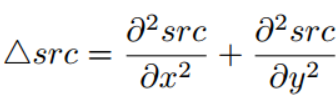

<p style = 'background-color:black;color:white;font-family:Georgia;font-size:18px'>White to black transition is known as 'Positive Slope' and black to white transition is known as 'Negative Slope'. Some edge detections are missed when the output datatype is int8. Hence having the output datatype as float64 is a better option for all edge detections. </p> 

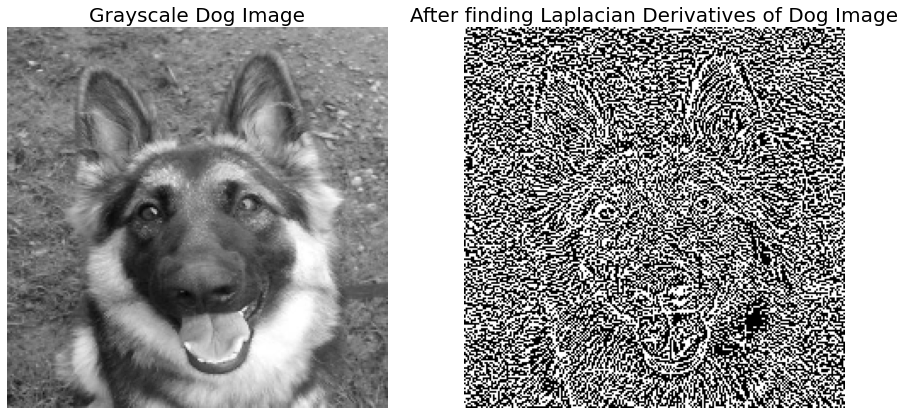

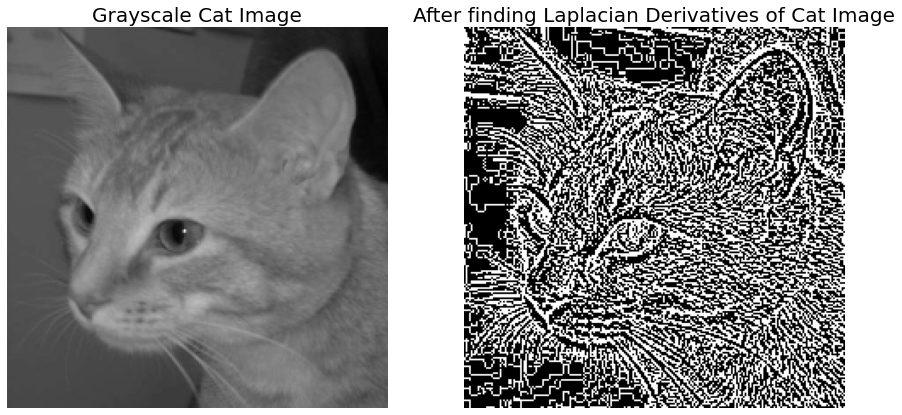

In [10]:
for i, path in enumerate(paths):
    
    name = os.path.split(path)[-1]
    img = cv2.imread(path, 0)
    resized_img = cv2.resize(img, (height, width))
    laplacian = cv2.Laplacian(resized_img, cv2.CV_64F)
    
    plt.figure(figsize=(15, 8))
    plt.subplot(1, 2, 1).set_title(f'Grayscale {name[ : -4]} Image', fontsize = font_size); plt.axis('off')
    plt.imshow(resized_img, cmap = 'gray')
    plt.subplot(1, 2, 2).set_title(f'After finding Laplacian Derivatives of {name[ : -4]} Image', fontsize = font_size); plt.axis('off')
    plt.imshow(cv2.cvtColor(laplacian.astype('float32'), cv2.COLOR_BGR2RGB))
    plt.show()

<h1 id = 'sec7' style = 'background-color:purple;color:white;font-family:COMIC SANS MS'> <center> 🔍 EDGE DETECTION 🔍 </center> </h1>

## **EDGE DETECTION**

<p style = 'background-color:black;color:white;font-family:Georgia;font-size:18px'> Edge Detection is performed using Canny Edge Detection which is a multi-stage algorithm. The stages to achieve edge detection are as follows. <br><br> 📌 Noise Reduction - Smoothen image using Gaussian filter <br> 📌 Find Intensity Gradient - Using the Sobel kernel, find the first derivative in the horizontal (Gx) and vertical (Gy) directions. The edge gradient is determined using the relation below. </p>

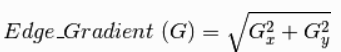

<p style = 'background-color:black;color:white;font-family:Georgia;font-size:18px'> 📌 Non-maximum Suppression - Remove unwanted pixels that may not be edges by checking if it is a local maximum in its neighborhood in the direction of the gradient <br> 📌 Hysteresis Thresholding - Decide whether all edges are really edges. There are two thresholds minVal and maxVal. Edges above the maxVal are sure edges and those below the minVal are not edges. The edges in between are edges if they are connected to a sure edge and not edges otherwise. </p>

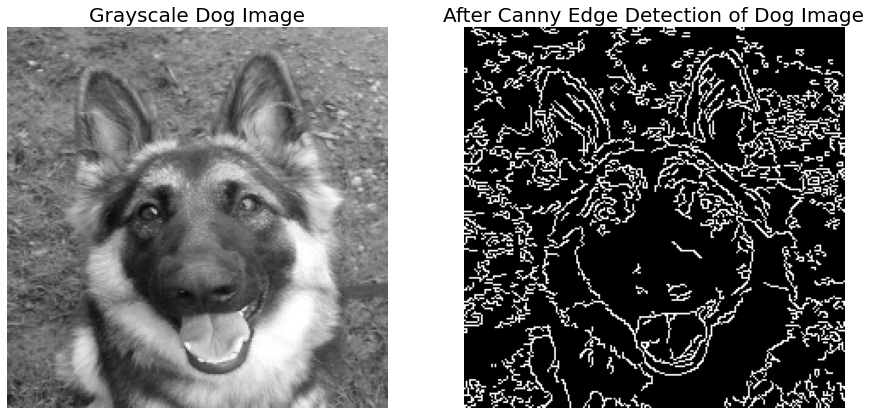

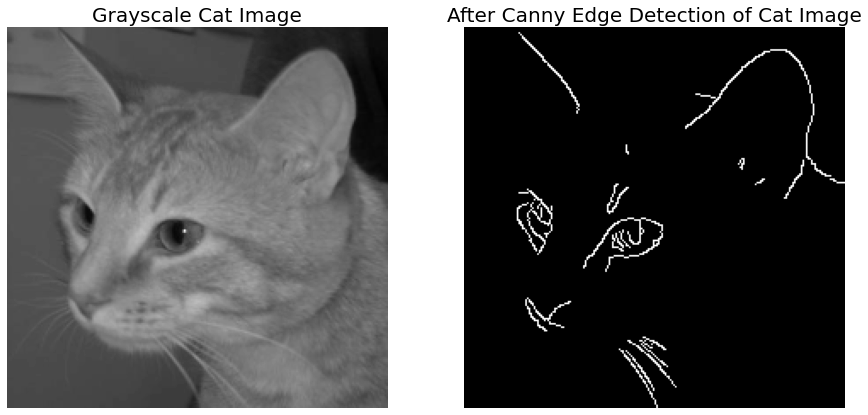

In [11]:
for i, path in enumerate(paths):
    
    name = os.path.split(path)[-1]
    img = cv2.imread(path, 0)
    resized_img = cv2.resize(img, (height, width))
    edges = cv2.Canny(resized_img, threshold1 = 100, threshold2 = 200)
    
    plt.figure(figsize=(15, 8))
    plt.subplot(1, 2, 1).set_title(f'Grayscale {name[ : -4]} Image', fontsize = font_size); plt.axis('off')
    plt.imshow(resized_img, cmap = 'gray')
    plt.subplot(1, 2, 2).set_title(f'After Canny Edge Detection of {name[ : -4]} Image', fontsize = font_size); plt.axis('off')
    plt.imshow(cv2.cvtColor(edges, cv2.COLOR_BGR2RGB))
    plt.show()

<h1 id = 'sec8' style = 'background-color:purple;color:white;font-family:COMIC SANS MS'> <center> 🌟 FOURIER TRANSFORM ON IMAGE 🌟 </center> </h1>

## **FOURIER TRANSFORM ON IMAGE**

<p style = 'background-color:black;color:white;font-family:Georgia;font-size:18px'> Fourier Transform analyzes the frequency characteristics of an image. Discrete Fourier Transform is used to find the frequency domain. Fast Fourier Transform (FFT) calculates the Discrete Fourier Transform. Frequency is higher usually at the edges or wherever noise is present. When FFT is applied to the image, the high frequency is mostly in the corners of the image. To bring that to the center of the image, it is shifted by N/2 in both horizontal and vertical directions. Finally, the magnitude spectrum of the outcome is achieved. Fourier Transform is helpful in object detection as each object has a distinct magnitude spectrum. </p>

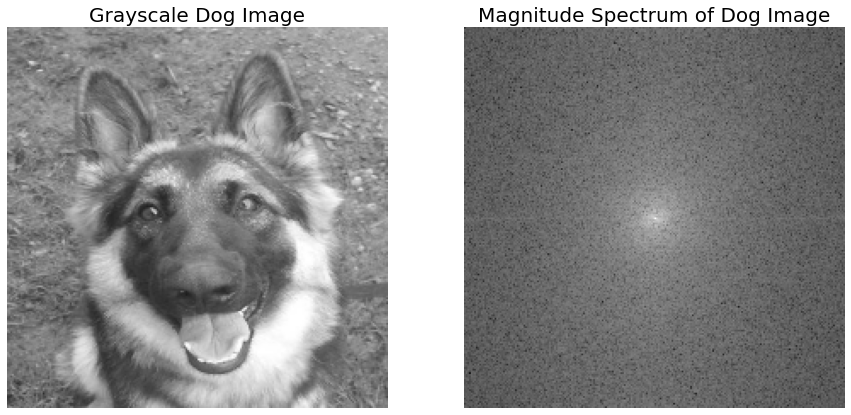

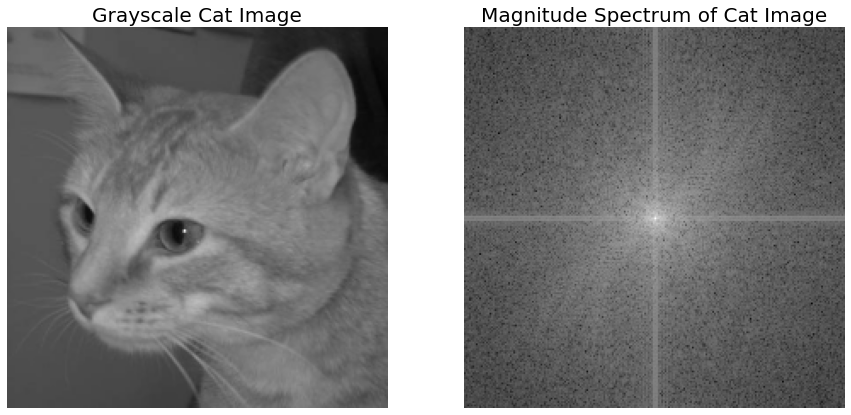

In [12]:
for i, path in enumerate(paths):
    
    name = os.path.split(path)[-1]
    img = cv2.imread(path, 0)
    resized_img = cv2.resize(img, (height, width))
    
    freq = np.fft.fft2(resized_img)
    
    freq_shift = np.fft.fftshift(freq)
    
    magnitude_spectrum = 20 * np.log(np.abs(freq_shift))

    plt.figure(figsize=(15, 8))
    plt.subplot(1, 2, 1).set_title(f'Grayscale {name[ : -4]} Image', fontsize = font_size); plt.axis('off')   
    plt.imshow(cv2.cvtColor(resized_img, cv2.COLOR_BGR2RGB))
    plt.subplot(1, 2, 2).set_title(f'Magnitude Spectrum of {name[ : -4]} Image', fontsize = font_size); plt.axis('off')   
    plt.imshow(magnitude_spectrum, cmap = 'gray')
    plt.show()

<h1 id = 'sec9' style = 'background-color:purple;color:white;font-family:COMIC SANS MS'> <center> ✏ LINE TRANSFORM ✏ </center> </h1>

## **LINE TRANSFORM**

<p style = 'background-color:black;color:white;font-family:Georgia;font-size:18px'> Hough Transform can detect any shape even if it is distorted when presented in mathematical form. A line in the cartesian coordinate system y = mx + c can be put in its polar coordinate system as rho = xcosθ + ysinθ. rho is the perpendicular distance from the origin to the line and θ is the angle formed by the horizontal axis and the perpendicular line in the clockwise direction. So, the line is represented in these two terms (rho, θ). An array is created for these two terms where rho forms the rows and θ forms the columns. This is called the accumulator. rho is the distance resolution of the accumulator in pixels and θ is the angle resolution of the accumulator in radians. For every line, its (x, y) values can be put into (rho, θ) values. For every (rho, θ) pair, the accumulator is incremented. This is repeated for every point on the line. A particular (rho, θ) cell is voted for the presence of a line. This way the cell with the maximum votes implies a presence of a line at rho distance from the origin and at angle θ degrees. </p>

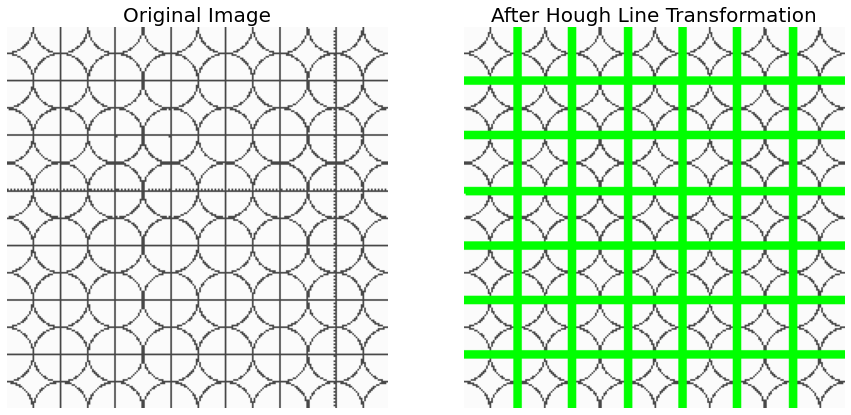

In [13]:
min_line_length = 100
max_line_gap = 10

img = cv2.imread('../input/cv-images/hough-min.png')
resized_img = cv2.resize(img, (height, width))
img_copy = resized_img.copy()

edges = cv2.Canny(resized_img, threshold1 = 50, threshold2 = 150)

lines = cv2.HoughLinesP(edges, rho = 1, theta = np.pi / 180, threshold = 100, minLineLength = min_line_length, maxLineGap = max_line_gap)

for line in lines:
    for x1, y1, x2, y2 in line:
        hough_lines_img = cv2.line(resized_img ,(x1,y1),(x2,y2),color = (0,255,0), thickness = 2)

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1).set_title('Original Image', fontsize = font_size); plt.axis('off')   
plt.imshow(cv2.cvtColor(img_copy, cv2.COLOR_BGR2RGB))
plt.subplot(1, 2, 2).set_title('After Hough Line Transformation', fontsize = font_size); plt.axis('off')   
plt.imshow(cv2.cvtColor(hough_lines_img, cv2.COLOR_BGR2RGB))
plt.show()

<h1 id = 'sec10' style = 'background-color:purple;color:white;font-family:COMIC SANS MS'> <center> 🔲 CORNER DETECTION 🔳 </center> </h1>

## **CORNER DETECTION**

<p style = 'background-color:black;color:white;font-family:Georgia;font-size:18px'> Harris Corner finds the difference in intensity for a displacement in all directions to detect a corner. This mathematical equation is given below. </p>

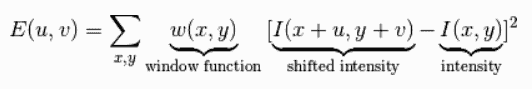

<p style = 'background-color:black;color:white;font-family:Georgia;font-size:18px'> Window function may be a rectangular window or Gaussian window. E(u, v) has to be maximized for corner detection which means the second term has to be maximized. By applying Taylor's Expansion to the above equation, we get the following equation. Ix and Iy are derivatives in the horizontal and vertical directions that can be obtained by Sobel operations. </p> 

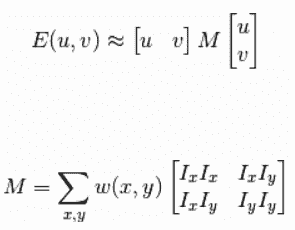

<p style = 'background-color:black;color:white;font-family:Georgia;font-size:18px'> Finally, the equation below decides whether a corner is detected or not. </p> 

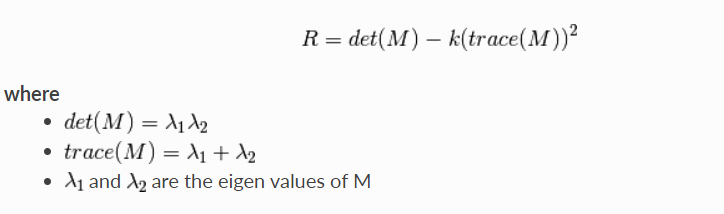

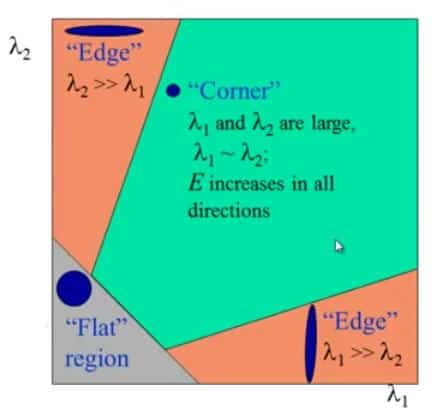

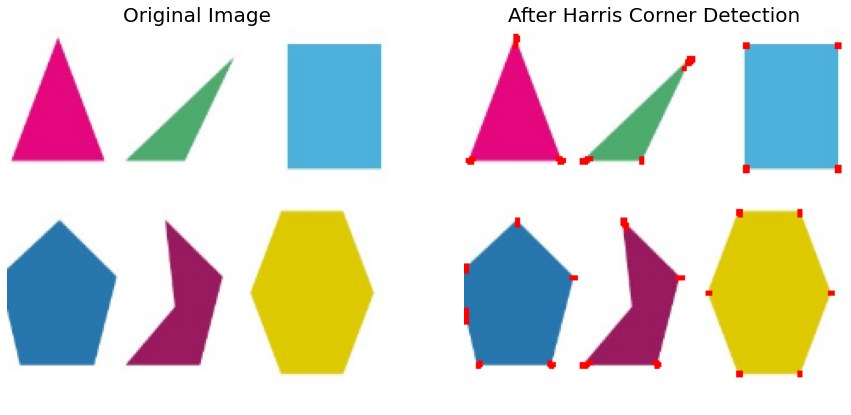

In [14]:
img = cv2.imread('../input/cv-images/corners-min.jpg')
resized_img = cv2.resize(img, (height, width))
img_copy = resized_img.copy()
gray = cv2.cvtColor(resized_img,cv2.COLOR_BGR2GRAY)

gray = np.float32(gray)
corners = cv2.cornerHarris(gray, blockSize = 2, ksize = 3, k = 0.04)

corners = cv2.dilate(corners, None)
resized_img[corners > 0.0001 * corners.max()] = [0, 0, 255]

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1).set_title('Original Image', fontsize = font_size); plt.axis('off')   
plt.imshow(cv2.cvtColor(img_copy, cv2.COLOR_BGR2RGB))
plt.subplot(1, 2, 2).set_title('After Harris Corner Detection', fontsize = font_size); plt.axis('off')   
plt.imshow(cv2.cvtColor(resized_img, cv2.COLOR_BGR2RGB))
plt.show()

<h1 id = 'sec11' style = 'background-color:purple;color:white;font-family:COMIC SANS MS'> <center> 🦋 MORPHOLOGICAL TRANSFORMATION OF IMAGE  🦋 </center> </h1>

## **MORPHOLOGICAL TRANSFORMATION OF IMAGE**

<p style = 'background-color:black;color:white;font-family:Georgia;font-size:18px'> Morphological Transformation is usually applied on binary images where it takes an image and a kernel which is a structuring element as inputs. Binary images may contain imperfections like texture and noise. These transformations help in correcting these imperfections by accounting for the form of the image. The types of morphological transformation are as follows. <br><br> 📌 Erosion - Erodes boundaries of the foreground object <br> 📌 Dilation - Opposite of Erosion <br> 📌 Opening - Erosion followed by Dilation <br> 📌 Closing - Dilation followed by Erosion <br> 📌 Morphological Gradient - Difference between Dilation and Erosion <br> 📌 Top Hat - Difference between the input image and Opening of the image <br> 📌 Black Hat - Difference between Closing of the image and input image <br><br> Morphological Opening and Closing are implemented below. </p>
    

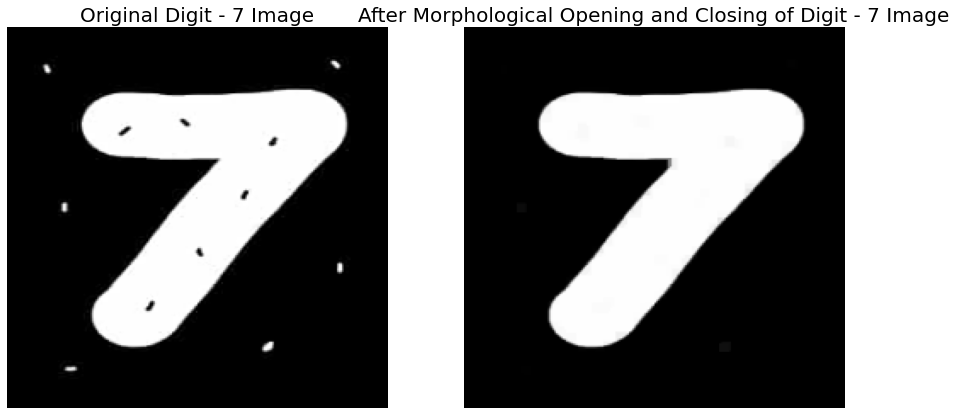

In [15]:
kernel = np.ones((5,5), np.uint8)

plt.figure(figsize=(15, 8))

img = cv2.imread('../input/cv-images/morph-min.jpg', cv2.IMREAD_COLOR)
resized_img = cv2.resize(img, (height, width))

morph_open = cv2.morphologyEx(resized_img, cv2.MORPH_OPEN, kernel)
morph_close = cv2.morphologyEx(morph_open, cv2.MORPH_CLOSE, kernel)
    
plt.subplot(1,2,1).set_title('Original Digit - 7 Image', fontsize = font_size); plt.axis('off')   
plt.imshow(cv2.cvtColor(resized_img, cv2.COLOR_BGR2RGB))
plt.subplot(1,2,2).set_title('After Morphological Opening and Closing of Digit - 7 Image', fontsize = font_size); plt.axis('off')   
plt.imshow(cv2.cvtColor(morph_close, cv2.COLOR_BGR2RGB))
plt.show()

<h1 id = 'sec12' style = 'background-color:purple;color:white;font-family:COMIC SANS MS'> <center> 🎲 GEOMETRIC TRANSFORMATION OF IMAGE  🎲 </center> </h1>

## **GEOMETRIC TRANSFORMATION OF IMAGE**

<p style = 'background-color:black;color:white;font-family:Georgia;font-size:18px'> Geometric Transformation of images is achieved by two transformation functions namely cv2.warpAffine and cv2.warpPerspective that receive a 2x3  and 3x3 transformation matrix respectively. The types of geometrics transformations are as follows. <br><br> 📌 Scaling - Resizing the image <br> 📌 Translation - Shifting object's location in the image <br> 📌 Rotation - Rotation of an image by an angle theta <br> 📌 Affine Transformation - All parallel lines remain parallel. Three points in the input image and their corresponding points in the output image are required to find the transformation matrix. <br> 📌 Perspective Transformation - It is similar to Affine Transformation but it is four points instead of three points and three of those four points must be collinear. <br><br> Perspective Transformation is implemented below. After finding the 3x3 transformation matrix using cv2.getPerspectiveTransform, cv2.warpPerspective is applied to it to get the final transformed image. </p>

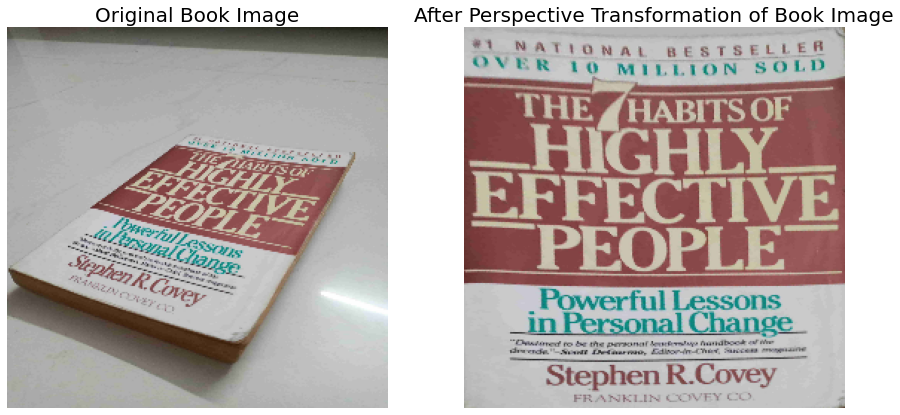

In [16]:
pts1 = np.float32([[1550, 1170],[2850, 1370],[50, 2600],[1850, 3450]])
pts2 = np.float32([[0,0],[4160,0],[0,3120],[4160,3120]])

img = cv2.imread('../input/cv-images/book-min.jpg', cv2.IMREAD_COLOR)

transformation_matrix = cv2.getPerspectiveTransform(pts1, pts2)

final_img = cv2.warpPerspective(img, M = transformation_matrix, dsize = (4160, 3120))

img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img = cv2.resize(img, (256, 256))
final_img = cv2.cvtColor(final_img, cv2.COLOR_BGR2RGB)
final_img = cv2.resize(final_img, (256, 256))
 
plt.figure(figsize=(15, 8))    
plt.subplot(1,2,1).set_title('Original Book Image', fontsize = font_size); plt.axis('off')   
plt.imshow(img)
plt.subplot(1,2,2).set_title('After Perspective Transformation of Book Image', fontsize = font_size); plt.axis('off')   
plt.imshow(final_img)
plt.show()

<h1 id = 'sec13' style = 'background-color:purple;color:white;font-family:COMIC SANS MS'> <center> ⭕ CONTOURS ⭕ </center> </h1>

## **CONTOURS**

<p style = 'background-color:black;color:white;font-family:Georgia;font-size:18px'> Contours are outlines representing the shape or form of objects in an image. They are useful in object detection and recognition. Binary images produce better contours. There are separate functions for finding and drawing contours. </p>

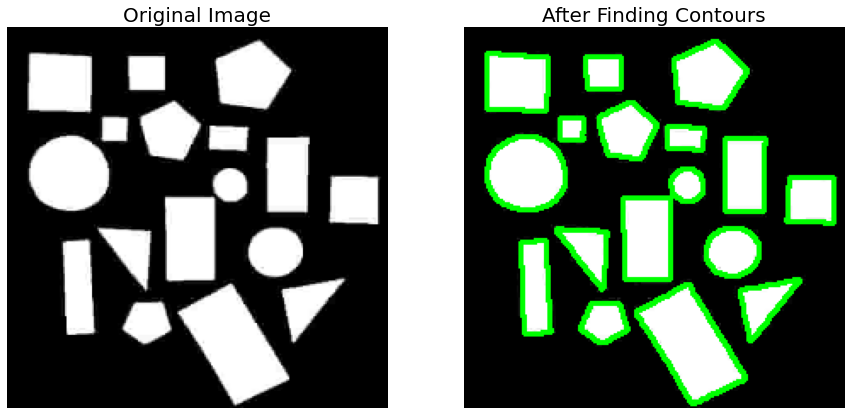

In [17]:
plt.figure(figsize=(15, 8))

img = cv2.imread('../input/cv-images/contours-min.jpg', cv2.IMREAD_COLOR)
resized_img = cv2.resize(img, (height, width))
contours_img = resized_img.copy()
img_gray = cv2.cvtColor(resized_img,cv2.COLOR_BGR2GRAY)

ret,thresh = cv2.threshold(img_gray, thresh = 127, maxval = 255, type = cv2.THRESH_BINARY)

contours, hierarchy = cv2.findContours(thresh, mode = cv2.RETR_TREE, method = cv2.CHAIN_APPROX_NONE)

cv2.drawContours(contours_img, contours, contourIdx = -1, color = (0, 255, 0), thickness = 2)

plt.subplot(1,2,1).set_title('Original Image', fontsize = font_size); plt.axis('off')   
plt.imshow(resized_img)
plt.subplot(1,2,2).set_title('After Finding Contours', fontsize = font_size); plt.axis('off')   
plt.imshow(contours_img)
plt.show()

<h1 id = 'sec14' style = 'background-color:purple;color:white;font-family:COMIC SANS MS'> <center> 🔆 IMAGE PYRAMIDS 🔆 </center> </h1>

## **IMAGE PYRAMIDS**

<p style = 'background-color:black;color:white;font-family:Georgia;font-size:18px'> Images have a resolution which is the measure of the information in the image. In certain scenarios of image processing like Image Blending, working with images of different resolutions is necessary to make the blend look more realistic. In OpenCV, images of high resolution can be converted to low resolution and vice-versa. By converting a higher-level image to a lower-level image, the lower-level image becomes 1/4th the area of the higher-level image. When this is done for a number of iterations and the resultant images are placed next to each other in order, it looks like it is forming a pyramid and hence its name 'Image Pyramid'. There are two types of Pyramids as follows. <br><br> 📌 Gradient Pyramids <br> 📌 Laplacian Pyramids <br><br> A level in the Laplacian pyramids is formed by the difference between that level in the Gaussian Pyramid and the expanded version of its upper level in the Gaussian Pyramid. <br><br> Steps for Image Blending are as follows. <br> 📌 Load both images <br> 📌 Find Gaussian Pyramids for both images <br> 📌 Find Laplacian Pyramids for both images <br> 📌 Join the halves of both images on either side in each level of Laplacian Pyramids <br> 📌 Reconstruct image </p>

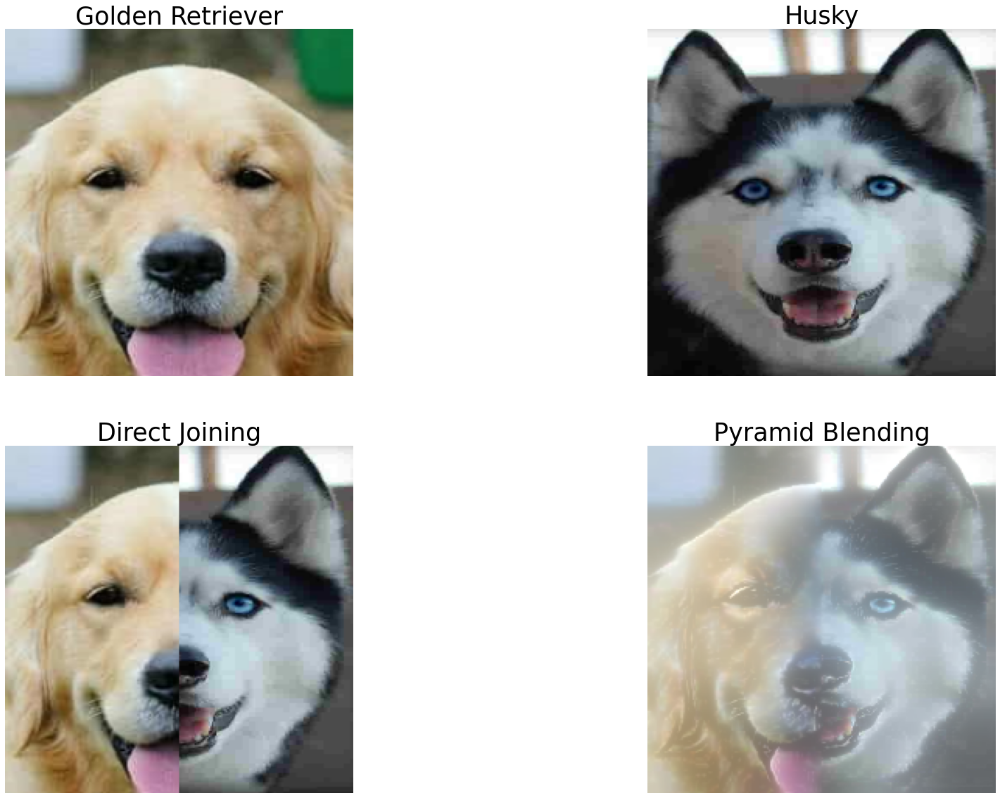

In [18]:

R = cv2.imread('../input/cv-images/GR-min.jpg', cv2.IMREAD_COLOR)
R = cv2.resize(R, (224, 224))
H = cv2.imread('../input/cv-images/H-min.jpg', cv2.IMREAD_COLOR)
H = cv2.resize(H, (224, 224))

G = R.copy()
guassian_pyramid_c = [G]
for i in range(6):
    G = cv2.pyrDown(G)
    guassian_pyramid_c.append(G)
 
     
G = H.copy()
guassian_pyramid_d = [G]
for i in range(6):
    G = cv2.pyrDown(G)
    guassian_pyramid_d.append(G)

laplacian_pyramid_c = [guassian_pyramid_c[5]]
for i in range(5, 0, -1):
    GE = cv2.pyrUp(guassian_pyramid_c[i])
    L = cv2.subtract(guassian_pyramid_c[i-1], GE)
    laplacian_pyramid_c.append(L)

laplacian_pyramid_d = [guassian_pyramid_d[5]]
for i in range(5,0,-1):
    guassian_expanded = cv2.pyrUp(guassian_pyramid_d[i])
    L = cv2.subtract(guassian_pyramid_d[i-1], guassian_expanded)
    laplacian_pyramid_d.append(L)

laplacian_joined = []
for lc,ld in zip(laplacian_pyramid_c, laplacian_pyramid_d):
    r, c, d = lc.shape
    lj = np.hstack((lc[:, 0 : int(c / 2)], ld[:, int(c / 2) :]))
    laplacian_joined.append(lj)

laplacian_reconstructed = laplacian_joined[0]
for i in range(1,6):
    laplacian_reconstructed = cv2.pyrUp(laplacian_reconstructed)
    laplacian_reconstructed = cv2.add(laplacian_reconstructed, laplacian_joined[i])

direct = np.hstack((R[ : , : int(c / 2)], H[ : , int(c / 2) : ]))

plt.figure(figsize=(30, 20))
plt.subplot(2,2,1).set_title('Golden Retriever', fontsize = 35); plt.axis('off')   
plt.imshow(cv2.cvtColor(R, cv2.COLOR_BGR2RGB))
plt.subplot(2,2,2).set_title('Husky', fontsize = 35); plt.axis('off')   
plt.imshow(cv2.cvtColor(H, cv2.COLOR_BGR2RGB))
plt.subplot(2,2,3).set_title('Direct Joining', fontsize = 35); plt.axis('off')   
plt.imshow(cv2.cvtColor(direct, cv2.COLOR_BGR2RGB))
plt.subplot(2,2,4).set_title('Pyramid Blending', fontsize = 35); plt.axis('off')   
plt.imshow(cv2.cvtColor(laplacian_reconstructed, cv2.COLOR_BGR2RGB))
plt.show()

<h1 id = 'sec15' style = 'background-color:purple;color:white;font-family:COMIC SANS MS'> <center> 🧡 COLORSPACE CONVERSION AND OBJECT TRACKING 💛 </center> </h1>

## **COLORSPACE CONVERSION AND OBJECT TRACKING**

<p style = 'background-color:black;color:white;font-family:Georgia;font-size:18px'> In Colorspace Conversion, BGR↔Gray, BGR↔HSV conversions are possible. The BGR↔Gray conversion was previously seen. HSV stands for Hue, Saturation, and Value respectively. Since HSV describes images in terms of their hue, saturation, and value instead of RGB where R, G, B are all co-related to color luminance, object discrimination is much easier with HSV images than RGB images. <br><br>
Steps for Object Tracking are listed below: <br> 📌 Convert Image from BGR to HSV <br> 📌 Threshold the HSV image to extract the pixels that are in a range of one's color of choice (Color White is chosen to extract the cat in the implementation below) <br> 📌 The remaining unextracted pixels are filled by pixels from another image (maybe background image) of one's choice / Anything can be done with the extracted object [Optional] </p>

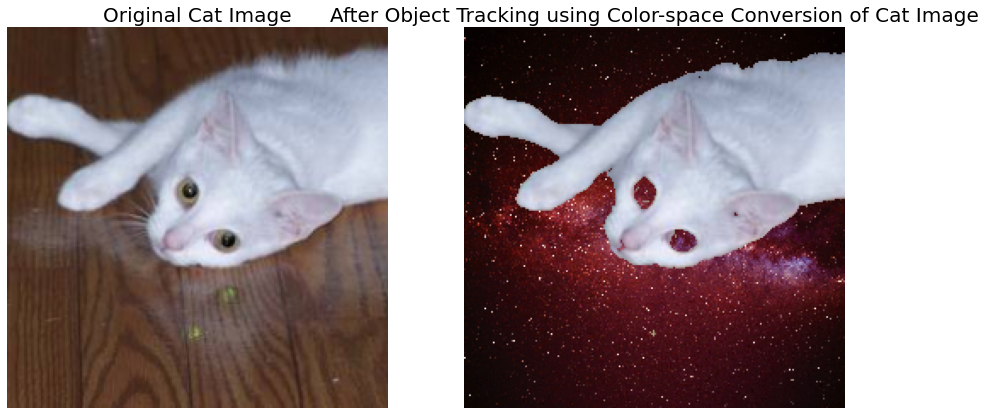

In [19]:
lower_white = np.array([0, 0, 150])
upper_white = np.array([255, 255, 255])

img = cv2.imread('../input/cv-images/color_space_cat.jpg', cv2.IMREAD_COLOR)
img = cv2.resize(img, (height, width))

background = cv2.imread("../input/cv-images/galaxy.jpg", cv2.IMREAD_COLOR)
background = cv2.resize(background, (height, width))

img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
hsv_img = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

mask = cv2.inRange(hsv_img, lowerb = lower_white, upperb = upper_white)

final_img = cv2.bitwise_and(img, img, mask = mask)
final_img = np.where(final_img == 0, background, final_img)

plt.figure(figsize=(15, 8))
plt.subplot(1,2,1).set_title('Original Cat Image', fontsize = font_size); plt.axis('off')   
plt.imshow(img)
plt.subplot(1,2,2).set_title('After Object Tracking using Color-space Conversion of Cat Image', fontsize = font_size); plt.axis('off')   
plt.imshow(final_img)
plt.show()

<h1 id = 'sec16' style = 'background-color:purple;color:white;font-family:COMIC SANS MS'> <center> 😺 INTERACTIVE FOREGROUND EXTRACTION 😺 </center> </h1>

## **INTERACTIVE FOREGROUND EXTRACTION**

<p style = 'background-color:black;color:white;font-family:Georgia;font-size:18px'> The foreground of the image is extracted using user input and Gaussian Mixture Model (GMM). Steps to extract the foreground of an image are as follows. <br><br> 📌 User Input - User provides a rectangular region where all pixels outside of it are sure background and everything inside is unknown <br> 📌 Initial Labelling - Computer performs initial labeling based on the given labels <br> 📌 GMM - Models the foreground and the background <br> 📌 GMM creates new pixel distribution - Based on the data, the model predicts a probable foreground or background for the unknown pixels (Similar to Clustering) <br> 📌 Build Graph - A graph is built for all the pixels where all the foreground pixels are connected to Source Node and all background pixels are connected to Sink Node. The weights between the pixels represent the similarity between the connected nodes. The weight of the edges connected to Source or Sink Node is defined by the probability of the pixel being a foreground or background pixel <br> 📌 Mincut Algorithm - It separates the graph into two segments each containing the Source and the Sink Node with Minimum Cost Function. The cost is the sum of all the weights of the edges in the segment. <br> 📌 Repeat - Repeat a number of iterations until the classification converges <br><br> GrabCut modifies the mask. Pixels are marked with four flags where 0 and 2 mean background and 1 and 3 mean foreground. </p>

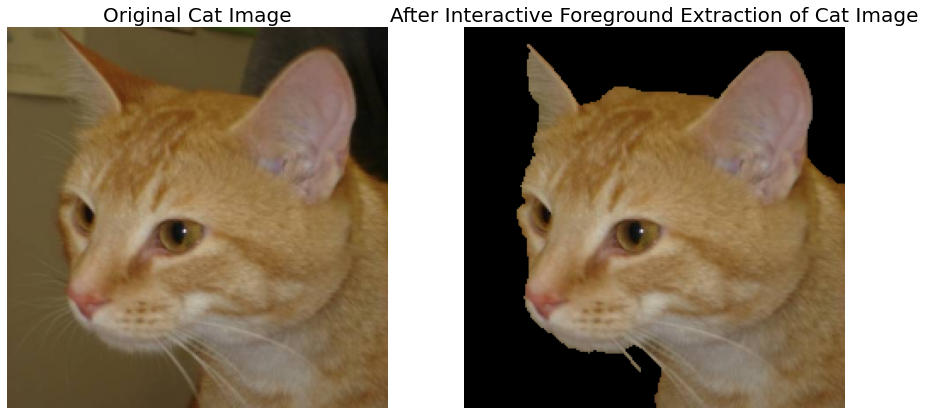

In [28]:
img = cv2.imread('../input/cv-images/Cat.jpg', cv2.IMREAD_COLOR)
img = cv2.resize(img, (height, width))
img_copy = img.copy()
mask = np.zeros(img.shape[ : 2], np.uint8)

background_model = np.zeros((1,65),np.float64)
foreground_model = np.zeros((1,65),np.float64)

rect = (10, 10, 224, 224)

cv2.grabCut(img, mask = mask, rect = rect, bgdModel = background_model, fgdModel = foreground_model, iterCount = 5, mode = cv2.GC_INIT_WITH_RECT)

new_mask = np.where((mask == 2) | (mask == 0), 0, 1).astype('uint8')
img = img * new_mask[:, :, np.newaxis]

plt.figure(figsize=(15, 8))
plt.subplot(1,2,1).set_title('Original Cat Image', fontsize = font_size); plt.axis('off')   
plt.imshow(cv2.cvtColor(img_copy, cv2.COLOR_BGR2RGB))
plt.subplot(1,2,2).set_title('After Interactive Foreground Extraction of Cat Image', fontsize = font_size); plt.axis('off')   
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.show()

<p style = 'background-color:black;color:white;font-family:Georgia;font-size:18px'> 

<h1 id = 'sec17' style = 'background-color:purple;color:white;font-family:COMIC SANS MS'> <center> 🍰 IMAGE SEGMENTATION 🍰 </center> </h1>

## **IMAGE SEGMENTATION**

<p style = 'background-color:black;color:white;font-family:Georgia;font-size:18px'> Image Segmentation is done using the Watershed Algorithm. This algorithm treats the grayscale image as hills and valleys representing high and low-intensity regions respectively. If these valleys are filled with colored water and as the water rises, depending on the peaks, different valleys with different colored water will start to merge. To avoid this, barriers can be built which gives the segmentation result. This is the concept of the Watershed algorithm. This is an interactive algorithm as one can specify which pixels belong to an object or background. The pixels that one is unsure about can be marked as 0. Then the watershed algorithm is applied on this where it updates the labels given and all the boundaries are marked as -1. The steps for Image Segmentation using the Watershed algorithm are as follows. <br><br> 📌 Thresholding - To differentiate individual objects from the background <br> 📌 Morphological Opening - Remove small white noises in the image <br> 📌 Dilation - To clearly identify the background of the image <br> 📌 Distance Transform - To clearly identify the objects of the image <br> 📌 Thresholding <br> 📌 Finding boundaries - Subtract foreground from background <br> 📌 Use Connected Components - It labels all the background pixels as 0 and other objects as any integer starting from 1 <br> 📌 Label region correctly - Since marking the background as 0 will be perceived as unknown by the Watershed algorithm. The background is marked as 1 and the unknown region is marked as  0. <br><br> Note: Distance Transform calculates the distance of a pixel from the nearest obstacle pixel. </p>

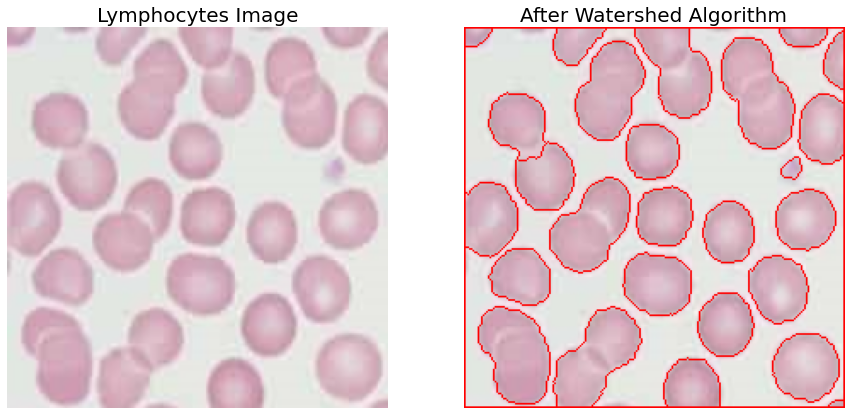

In [21]:
kernel = np.ones((3 , 3), np.uint8)

img = cv2.imread('../input/cv-images/lymphocytes-min.jpg', cv2.IMREAD_COLOR)
resized_img = cv2.resize(img, (height, width))
img_copy = resized_img.copy()

gray = cv2.cvtColor(resized_img, cv2.COLOR_BGR2GRAY)
ret, thresh = cv2.threshold(gray, thresh = 0, maxval = 255, type = cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

opening = cv2.morphologyEx(thresh, op = cv2.MORPH_OPEN, kernel = kernel, iterations = 2)
background = cv2.dilate(opening, kernel = kernel, iterations = 5)

dist_transform = cv2.distanceTransform(opening,cv2.DIST_L2,5)
ret, foreground = cv2.threshold(dist_transform, thresh = 0.2  * dist_transform.max(), maxval = 255, type = cv2.THRESH_BINARY)

foreground = np.uint8(foreground)
unknown = cv2.subtract(background, foreground)

ret, markers = cv2.connectedComponents(foreground)

markers = markers + 1
markers[unknown == 255] = 0

markers = cv2.watershed(resized_img, markers)
resized_img[markers == -1] = [0, 0, 255]

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1).set_title('Lymphocytes Image', fontsize = font_size); plt.axis('off')   
plt.imshow(cv2.cvtColor(img_copy, cv2.COLOR_BGR2RGB))
plt.subplot(1, 2, 2).set_title('After Watershed Algorithm', fontsize = font_size); plt.axis('off')   
plt.imshow(cv2.cvtColor(resized_img, cv2.COLOR_BGR2RGB))
plt.show()

<h1 id = 'sec18' style = 'background-color:purple;color:white;font-family:COMIC SANS MS'> <center> 🎨 IMAGE INPAINTING 🎨 </center> </h1>

## **IMAGE INPAINTING**

<p style = 'background-color:black;color:white;font-family:Georgia;font-size:18px'> Images may be damaged and require fixing. For example, an image may have no pixel information in certain portions. Image Inpainting will fill all the missing information with the help of the surrounding pixels. There are two algorithms for performing Image Inpainting <br><br> 📌 An Image Inpainting Technique Based on the Fast Marching Method - Fast Marching Method (Explained below) <br> 📌 Navier-Stokes, Fluid Dynamics, and Image and Video Inpainting - Inspired by partial differential equations <br> <br> 
It starts by filling the portion near the boundaries and then gradually fills the inside. It takes a small neighborhood of the pixel that is to be inpainted and calculates the weighted sum of all those neighborhood pixels as the fill value. Obviously, the pixels that are nearer to the target pixel are given a higher weightage than those far away. Once a pixel is filled, it repeats this process for all remaining pixels using the Fast Marching Method (FMM). FMM paints the pixels near to the known pixels first like a manual heuristic. FFM is implemented below. </p>

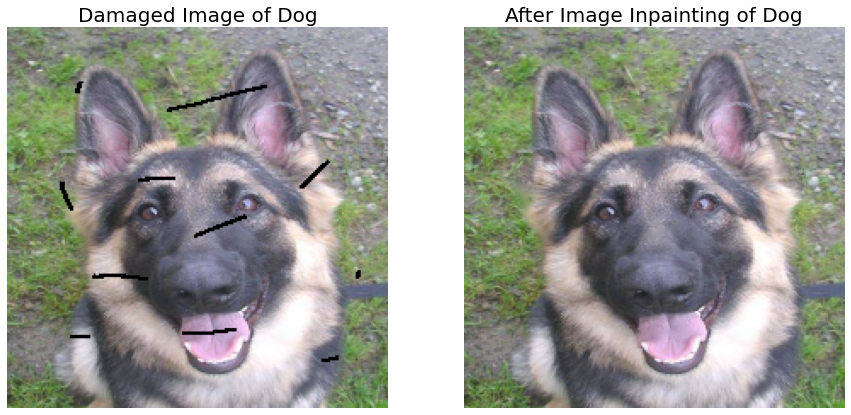

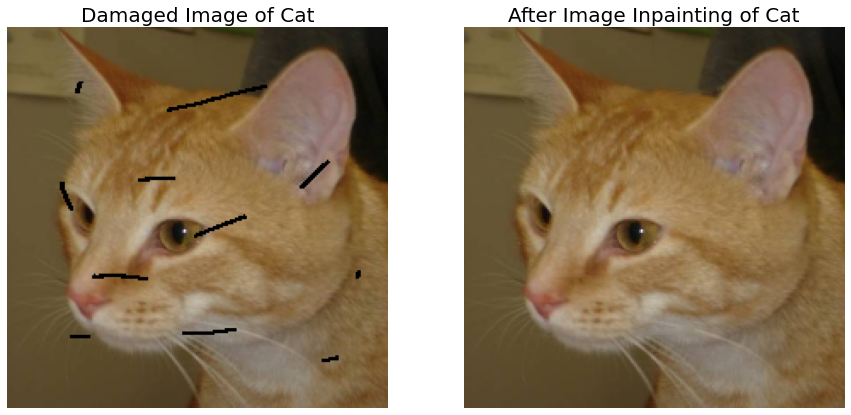

In [22]:
mask = cv2.imread('../input/cv-images/mask.png',0)
mask = cv2.resize(mask, (height, width))

for i, path in enumerate(paths):
    
    name = os.path.split(path)[-1]
    img = cv2.imread(path, cv2.IMREAD_COLOR)
    resized_img = cv2.resize(img, (height, width))
    
    ret, th = cv2.threshold(mask, 127, 255, cv2.THRESH_BINARY)
    inverted_mask = cv2.bitwise_not(th)
    damaged_img = cv2.bitwise_and(resized_img, resized_img, mask = inverted_mask)
    
    result = cv2.inpaint(resized_img, mask, inpaintRadius = 3, flags = cv2.INPAINT_TELEA)


    plt.figure(figsize=(15, 8))
    plt.subplot(1, 2, 1).set_title(f'Damaged Image of {name[ : -4]}', fontsize = font_size); plt.axis('off')   
    plt.imshow(cv2.cvtColor(damaged_img, cv2.COLOR_BGR2RGB))
    plt.subplot(1, 2, 2).set_title(f'After Image Inpainting of {name[ : -4]}', fontsize = font_size); plt.axis('off')   
    plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
    plt.show()

<h1 id = 'sec19' style = 'background-color:purple;color:white;font-family:COMIC SANS MS'> <center> 👩 TEMPLATE MATCHING 👩 </center> </h1>

## **TEMPLATE MATCHING**

<p style = 'background-color:black;color:white;font-family:Georgia;font-size:18px'> Template Matching matches the template provided to the image in which the template must be found. The template is compared to each patch of the input image. This is similar to a 2D convolution operation. It results in a grayscale image where each pixel denotes the similarity of the neighborhood pixels to that of the template. From this output, the maximum/minimum value is determined. This can be regarded as the top-left corner coordinates of the rectangle. By also considering the width and height of the template, the resultant rectangle is the region of the template in the image. </p>

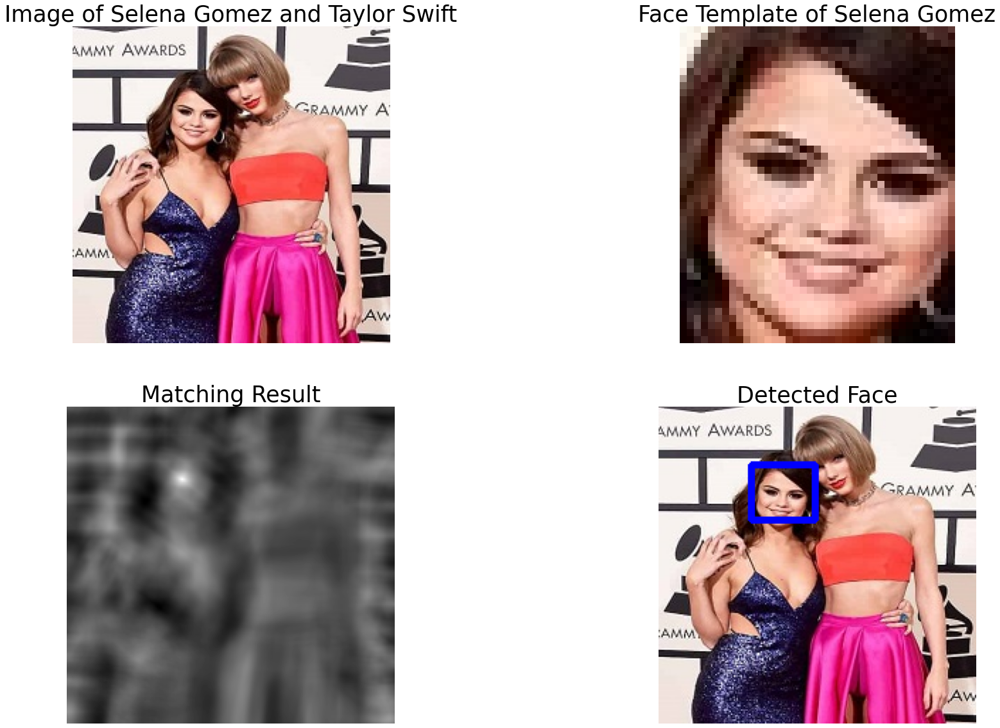

In [23]:

img = cv2.imread('../input/cv-images/gomez_swift-min.jpg', cv2.IMREAD_COLOR)
img_copy = img.copy()
template = cv2.imread('../input/cv-images/gomez-min.jpg', cv2.IMREAD_COLOR)
w, h, c = template.shape

method = eval('cv2.TM_CCOEFF')

result = cv2.matchTemplate(img, templ = template, method = method)
min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(result)

top_left = max_loc

bottom_right = (top_left[0] + w, top_left[1] + h)

cv2.rectangle(img, top_left, bottom_right, color = (255, 0, 0), thickness = 3)

plt.figure(figsize=(30, 20))
plt.subplot(2, 2, 1).set_title('Image of Selena Gomez and Taylor Swift', fontsize = 35); plt.axis('off')
plt.imshow(cv2.cvtColor(img_copy, cv2.COLOR_BGR2RGB))
plt.subplot(2, 2, 2).set_title('Face Template of Selena Gomez', fontsize = 35); plt.axis('off')
plt.imshow(cv2.cvtColor(template, cv2.COLOR_BGR2RGB))
plt.subplot(2, 2, 3).set_title('Matching Result', fontsize = 35); plt.axis('off')
plt.imshow(result, cmap = 'gray')
plt.subplot(2, 2, 4).set_title('Detected Face', fontsize = 35); plt.axis('off')
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.show()

<h1 id = 'sec20' style = 'background-color:purple;color:white;font-family:COMIC SANS MS'> <center> 😃 FACE AND EYE DETECTION 👀 </center> </h1>

## **FACE AND EYE DETECTION**

<p style = 'background-color:black;color:white;font-family:Georgia;font-size:18px'> Object Detection is done using Haar Cascades. It uses a Machine Learning approach that trains on positive and negative examples. Then it extracts features like convolutional kernels. The best features of those large number of features are filtered that may be irrelevant which is achieved by Adaboost. There is a threshold for each feature for classification. After each classification, weights of misclassified images are increased and new error rates are determined. This process is continued until accuracy or error rate or the number of features is achieved. The final classifier is the weighted sum of weak classifiers that are not competent enough to function on their own. Using Cascade of Classifiers, the features are grouped into different stages. Hence, if the window fails a particular stage, it is not considered for further stages. Once the face is found, that rectangular portion is only passed to the eye detector instead of the whole image. 

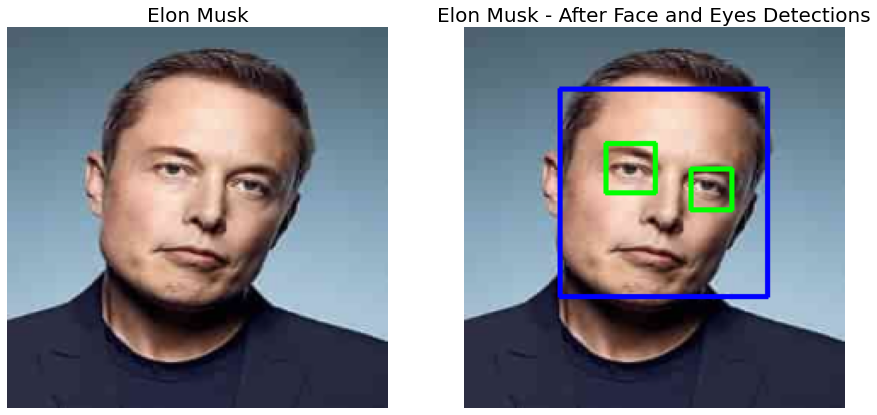

In [24]:
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')
eye_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_eye.xml')

img = cv2.imread('../input/cv-images/elon-min.jpg')
img = cv2.resize(img, (height, width))
img_copy = img.copy()

gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

faces = face_cascade.detectMultiScale(gray, scaleFactor = 1.3, minNeighbors = 5)

for (fx, fy, fw, fh) in faces:
    img = cv2.rectangle(img, (fx, fy), (fx + fw, fy + fh), (255, 0, 0), 2)

    roi_gray = gray[fy:fy+fh, fx:fx+fw]
    roi_color = img[fy:fy+fh, fx:fx+fw]
    
    eyes = eye_cascade.detectMultiScale(roi_gray)
    
    for (ex, ey, ew, eh) in eyes:
        cv2.rectangle(roi_color, (ex, ey), (ex + ew, ey + eh), (0, 255, 0), 2)
        
plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1).set_title('Elon Musk', fontsize = font_size); plt.axis('off')   
plt.imshow(cv2.cvtColor(img_copy, cv2.COLOR_BGR2RGB))
plt.subplot(1, 2, 2).set_title('Elon Musk - After Face and Eyes Detections', fontsize = font_size); plt.axis('off')   
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.show()       

<h3 style = 'font-family: Comic Sans MS;background-color:#FFD3B5;color:black;'> PLEASE UPVOTE AND SHARE IF YOU FOUND ANYTHING HELPFUL. THANK YOU IN ADVANCE! </h3>

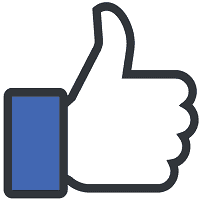